<a href="https://colab.research.google.com/github/mellisairawan/OrbitFutureAcademy2/blob/main/Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import cv2

# **Open CV with Cascade Classifier**

In [ ]:
# Import Image
path = '/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people1.jpg'
image = cv2.imread(path)

In [ ]:
# See our image shape
image.shape # one channel for red, one channel for green, one channel for blue

(1280, 1920, 3)

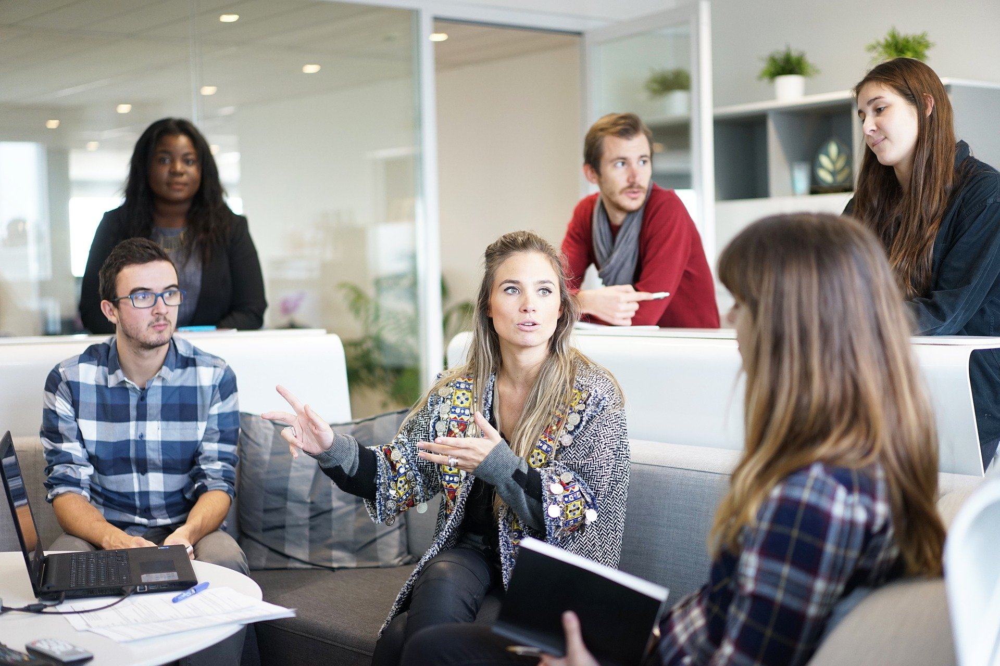

In [ ]:
# See our imported image
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
# Resize the image
image = cv2.resize(image, (800, 600))
image.shape #number of information stored in picture = 600*800*3

(600, 800, 3)

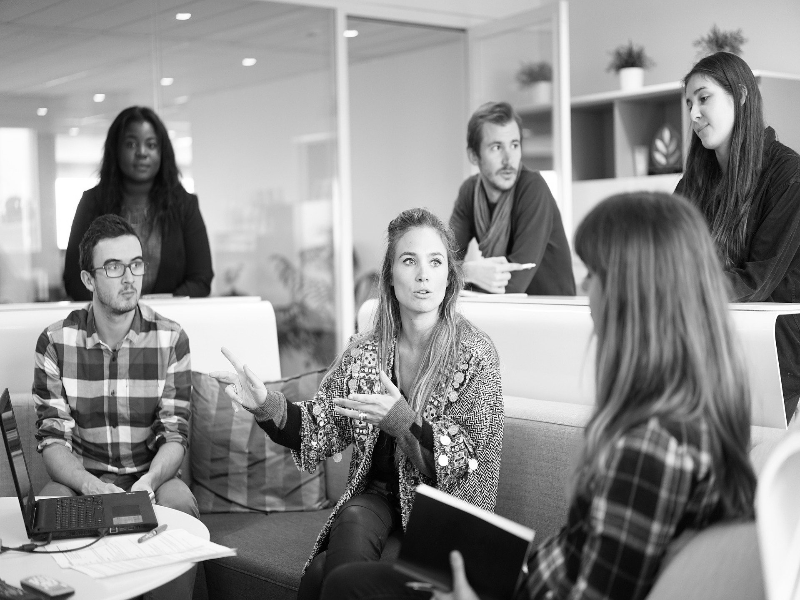

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [ ]:
image_gray.shape

(600, 800)

## **Detecting Faces**

In [ ]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(image_gray)

In [ ]:
detections #six faces (row) were detected

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
len(detections)

6

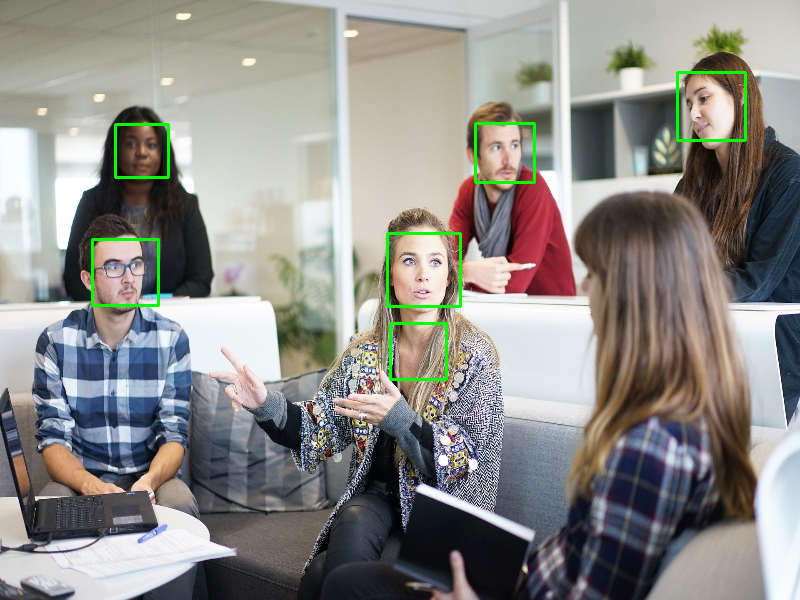

In [ ]:
for (x, y, w, h) in detections:
  #print(x, y, w, h)
  cv2.rectangle(image, 
                (x, y), # initial point
                (x+w, y+h), # movement point
                (0,255,0), # color of the box
                2) #intensity

cv2_imshow(image)

## **Haarcascade Parameters**

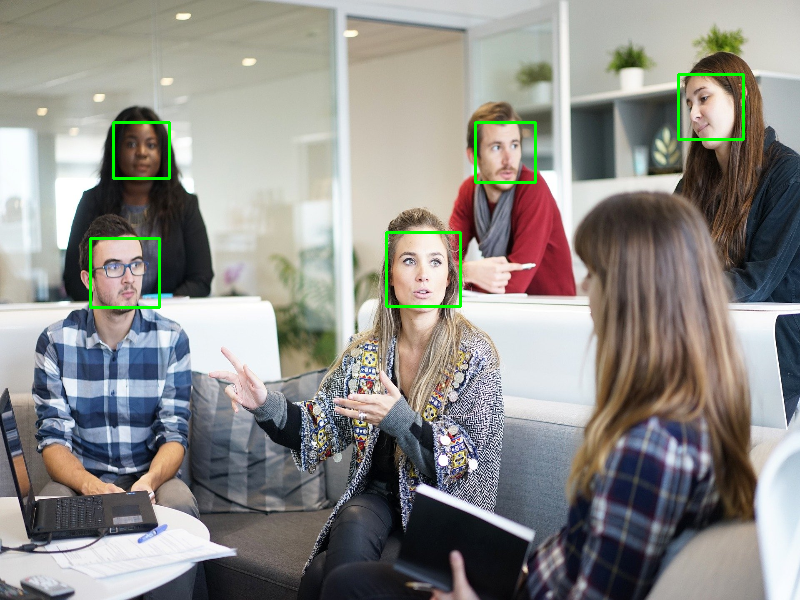

In [ ]:
image = cv2.imread(path)
image = cv2.resize(image, (800,600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
detections = face_detector.detectMultiScale(image, scaleFactor = 1.09) #set parameters to reduce false positive
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(image)

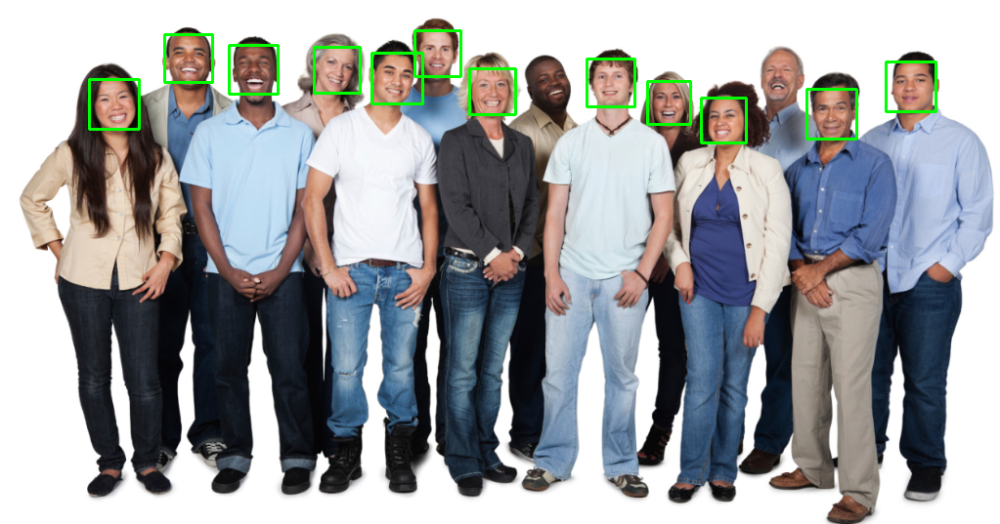

In [ ]:
path_2 = '/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people2.jpg'
image = cv2.imread(path_2)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
detections = face_detector.detectMultiScale(image, scaleFactor = 1.2, minNeighbors=7) #set parameters to reduce false positive
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(image)

## **Eye Detection and Better Face Detection**

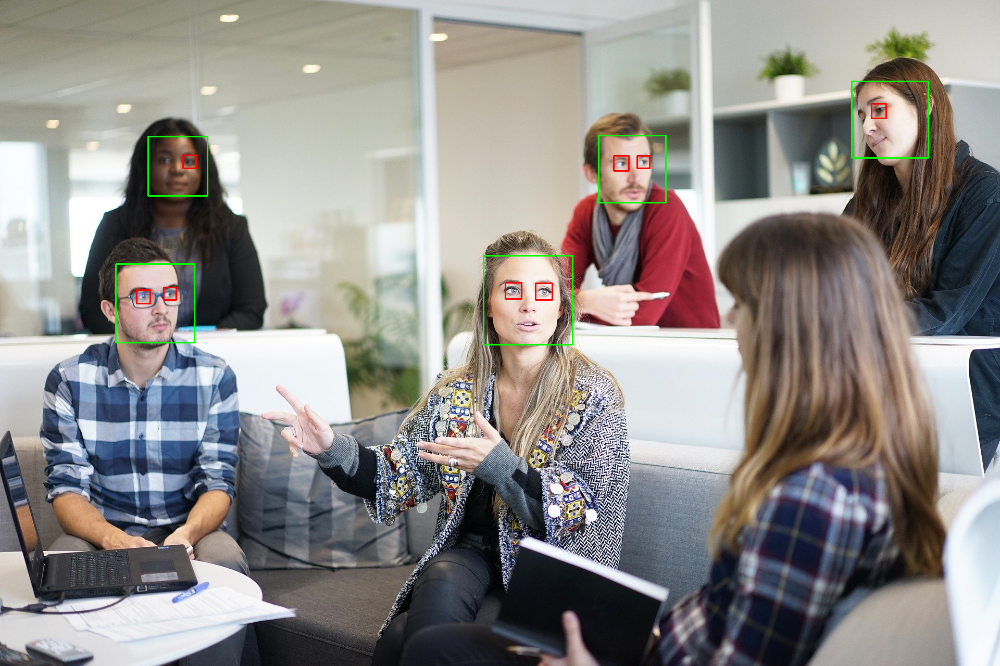

In [ ]:
image = cv2.imread(path)
#image = cv2.resize(image, (800,600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize=(30,30)) # add min size
for (x, y, w, h) in face_detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0), 2)

eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')
eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors=10, maxSize=(40,40)) # add max size
for (x, y, w, h) in eye_detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,0,255), 2)

cv2_imshow(image)

# **Histogram of Oriented Gradients**

In [ ]:
import dlib

## **Detecting Faces with HOG**

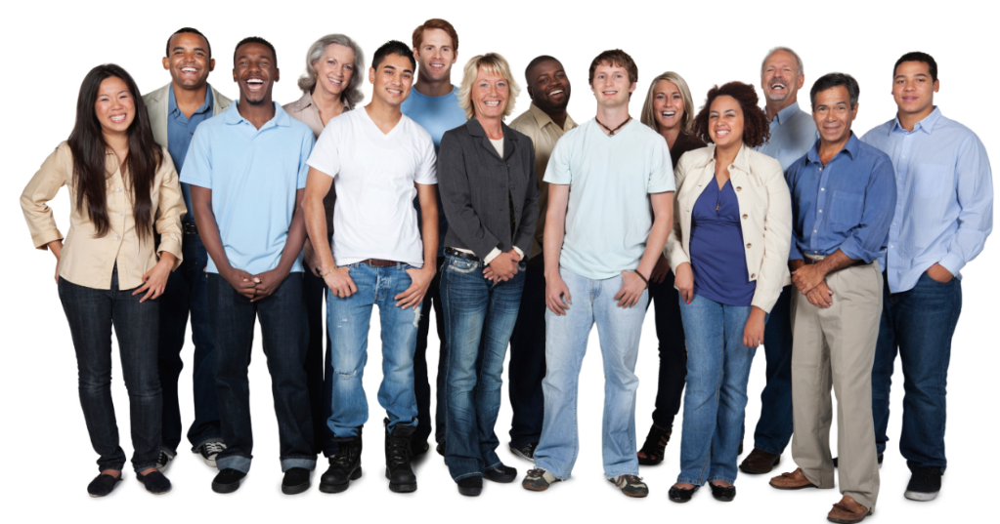

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()

In [ ]:
detections = face_detector_hog(image, 2) # the bigger the number is, the smaller the box is (more accurate)

In [ ]:
detections, len(detections) # number of detections is 14, it can detect all the faces
# the order is rectangles[[(left, top),(right, bottom)]]

(rectangles[[(428, 39) (466, 77)], [(665, 89) (702, 126)], [(713, 102) (758, 147)], [(828, 97) (873, 142)], [(908, 67) (952, 112)], [(777, 60) (814, 97)], [(97, 89) (134, 126)], [(602, 68) (640, 106)], [(385, 57) (430, 102)], [(482, 77) (520, 114)], [(171, 42) (216, 87)], [(236, 52) (280, 97)], [(325, 56) (362, 93)], [(549, 68) (586, 106)]],
 14)

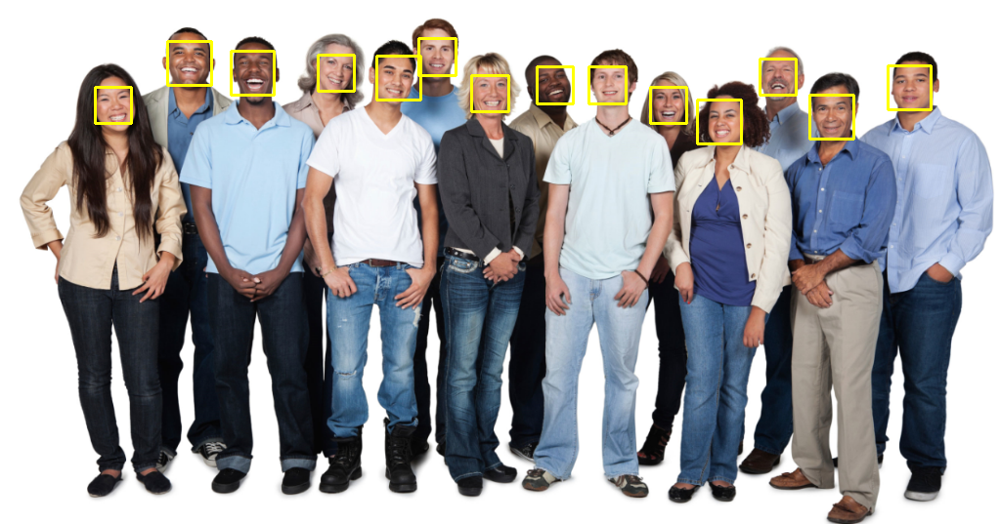

In [ ]:
for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)
cv2_imshow(image)

# **Face Detection with CNN**

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people2.jpg')

In [ ]:
# Import face detector
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

1.1440614461898804
1.137049913406372
1.1278995275497437
1.1200283765792847
1.1149375438690186
1.1131553649902344
1.0975688695907593
1.0942121744155884
1.085315227508545
1.0801889896392822
1.0800762176513672
1.0784764289855957
1.066403865814209
1.0641791820526123


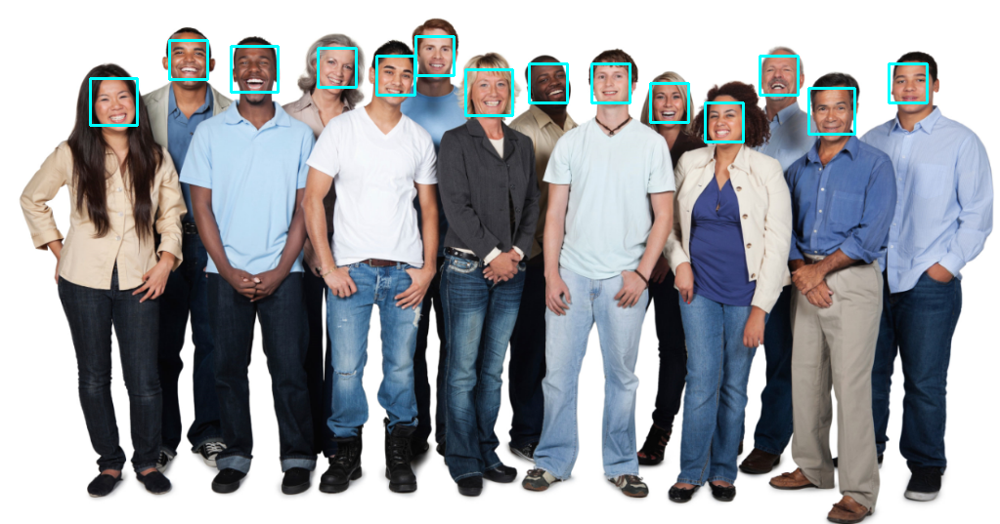

In [ ]:
# Do face detection
detections = cnn_detector(image, 1)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c) # the higher the value of confidence, the more sure it is
  cv2.rectangle(image, (l, t), (r, b), (255, 255, 0), 2)
cv2_imshow(image)

# **Haarcascade vs HOG vs CNN**

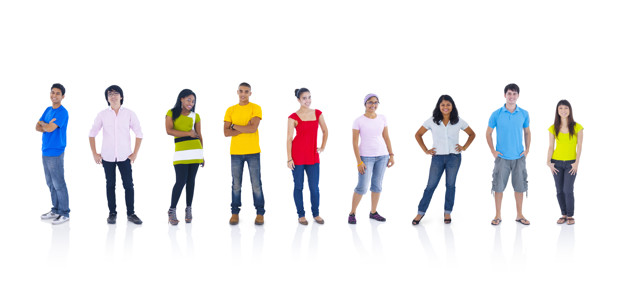

In [ ]:
# Haarcascade
# Import the image we will be using
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people3.jpg')
#image = cv2.resize(image, (1000,500))

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.001, maxSize=(1,1), minNeighbors=20)
for x, y, w, h in detections:
  cv2.rectangle(image, (x, y), (x+w, y+h), (0,255,0), 2)
cv2_imshow(image)

The faces are very small, Haarcascade can't detect all of the faces...

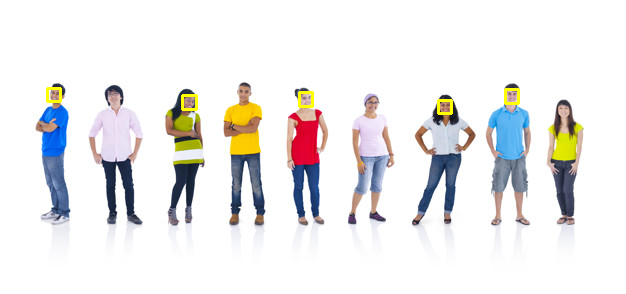

In [ ]:
# HOG
# Import the image we will be using
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people3.jpg')

face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 4)
for face in detections:
  left, top, right, bottom = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (left, top), (right, bottom), (0,255,255), 2)
cv2_imshow(image)

HOG can detect 5 faces

0.47086912393569946
0.052145302295684814


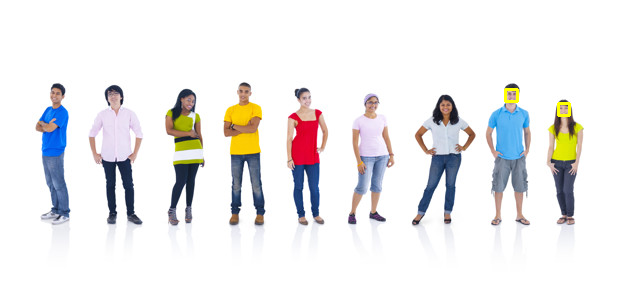

In [ ]:
# CNN
# Import the image we will be using
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Images/people3.jpg')

face_detector_cnn = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')
detections = face_detector_cnn(image,3)
for face in detections:
  left, top, right, bottom, confidence = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(confidence)
  cv2.rectangle(image, (left, top), (right, bottom), (0,255,255), 2)
cv2_imshow(image)

CNN can only detect 2 faces with very low confidence level. Hence, for this case, HOG is better than the two other methods.